In [2]:

import numpy as np
import pandas as pd
import pathlib
import os 
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from skimage.measure import label, regionprops, regionprops_table

import warnings

In [3]:
# load the csv  geberated in annotationAnalysis.ipynb
comb_df = pd.read_csv("/user/s.chakrabarty/myoTwinWork/data/csvSpheroidImages/combinedAnnotated.csv")
comb_df
# comb_df[comb_df['example']=='spheroid1_20230327_JK_diff_230009_RIT1a_MC_4_dish_2_d5.tiff']
# print(len(comb_df))
comb_df['Shape_tags'].value_counts(), comb_df['Density_tags'].value_counts(), comb_df['Cystic_tags'].value_counts(), comb_df['Overlapping_tags'].value_counts()


(Shape_tags
 IrregularShaped    307
 RoundShaped        170
 OvalShaped          72
 Name: count, dtype: int64,
 Density_tags
 LightEB    547
 DenseEB      2
 Name: count, dtype: int64,
 Cystic_tags
 NonCytstic       434
 Cytstic           84
 HeavilyCystic     31
 Name: count, dtype: int64,
 Overlapping_tags
 NotOverlapping    549
 Name: count, dtype: int64)

# property speicifc csv 

In [3]:
comb_df

,example,Cropped_Detail,Location_tags,Overlapping_tags,Connected_tags,Density_tags,Outline_tags,Determine_tags,Cystic_tags,Shape_tags
0,spheroid1_20230530_JK_WT2.3_2_4uM_dish_a_d20_2...,0,Edge,NotOverlapping,NotConnected,LightEB,SmoothOutline,CanDetermine,Cytstic,RoundShaped
1,spheroid2_20230530_JK_WT2.3_2_4uM_dish_a_d20_2...,0,Center,NotOverlapping,NotConnected,LightEB,SmoothOutline,CannotDetermine,NonCytstic,IrregularShaped
2,spheroid3_20230530_JK_WT2.3_2_4uM_dish_a_d20_2...,0,Center,NotOverlapping,NotConnected,LightEB,SmoothOutline,CannotDetermine,NonCytstic,IrregularShaped
3,spheroid4_20230530_JK_WT2.3_2_4uM_dish_a_d20_2...,0,Center,NotOverlapping,NotConnected,LightEB,RoughOutline,CanDetermine,NonCytstic,RoundShaped
4,spheroid5_20230530_JK_WT2.3_2_4uM_dish_a_d20_2...,0,Center,NotOverlapping,NotConnected,LightEB,RoughOutline,CanDetermine,NonCytstic,RoundShaped
...,...,...,...,...,...,...,...,...,...,...
544,spheroid8_20230515_MG_230014_isWTBld_2.3.2_dis...,0,Center,NotOverlapping,NotConnected,LightEB,RoughOutline,CanDetermine,Cytstic,RoundShaped
545,spheroid9_20230515_MG_230014_isWTBld_2.3.2_dis...,0,Center,NotOverlapping,NotConnected,LightEB,RoughOutline,CanDetermine,Cytstic,OvalShaped
546,spheroid10_20230515_MG_230014_isWTBld_2.3.2_di...,0,Center,NotOverlapping,NotConnected,LightEB,RoughOutline,CanDetermine,Cytstic,RoundShaped
547,spheroid11_20230515_MG_230014_isWTBld_2.3.2_di...,0,Edge,NotOverlapping,NotConnected,LightEB,RoughOutline,CanDetermine,Cytstic,IrregularShaped


## filter and combine the properties into one dictinary 

In [5]:
def filterSpheroidImg(imgName, df, filterCols, featureCols):
    
    x = df[df['example'] == imgName]
    filterTags = list(x[filterCols].values.flat)
    featureTags = list(x[featureCols].values.flat)
    if ('Edge' in filterTags) or ('CannotDetermine' in filterTags):
        consider = 'ignore'
    elif ('Center' in filterTags) and ('CanDetermine' in filterTags) : 
        print(f'\nselected---{filterTags}---{imgName}')
        consider = True
    else:
        consider = False
    
    return filterTags, featureTags, consider

def filteredEbProp(path, comb_df, filterCols, featureCols, regionProps, extra_regionProps):

    with open(path, 'rb') as f:
        data = pickle.load(f)
        # mask = data[0]
        # oriImage = data[1]
        spheroidInfoDic = data[2]
        # markedImage = data[3]
        # stats(area,x,y,h,w,centroids[i]) = spheroidInfoDic[spheroidName][0]
        # cropped_oriImage = spheroidInfoDic[spheroidName][1]
        # componentMask = spheroidInfoDic[spheroidName][3]

    tempDic = {}
    for index, spheroidName in enumerate(spheroidInfoDic):
        
        cropped_segMask = spheroidInfoDic[spheroidName][2]
        cropped_segImage = spheroidInfoDic[spheroidName][4]

        filterTags, featureTags, consider = filterSpheroidImg(spheroidName, comb_df, filterCols, featureCols)

        if consider == True:    
            props = regionprops_table(label_image = cropped_segMask, intensity_image = cropped_segImage, 
                                      properties = regionProps, extra_properties = extra_regionProps ) 
            if len(props['label']) != 1: 
                print(f'selected----{spheroidName}---> but multiple labels detected')
                # print(props,'\n\n')
            tempDic[spheroidName] = {'spheroidName':spheroidName, 'area':spheroidInfoDic[spheroidName][0][0], 
                                               'featureTags':featureTags, 'properties':props }
    return tempDic

def extractedFeaturesDictionary(path_spheroidDetails, comb_df, filterCols, featureCols, regionProps, extra_regionProps):
    combInfoDic = {}
    for dirname, _, filenames in os.walk(path_spheroidDetails):
        for filename in filenames:
            if filename == '.DS_Store' or pathlib.Path(filename).suffix == '.pickle':
                continue
            else:
                path = os.path.join(dirname, filename)
                # print(path)
                tempDic = filteredEbProp(path, comb_df, filterCols, featureCols, regionProps, extra_regionProps)
                combInfoDic.update(tempDic)
                print(f'{len(tempDic)}-Eb in {filename} \n-{len(combInfoDic)} combined filteredEB\n' )
            # break
    return combInfoDic


In [6]:
## part of the extra property to extract example 
def pixelcount(regionmask):
    return np.sum(regionmask)



# path_spheroidDetails = '/user/s.chakrabarty/myoTwinWork/data/spheroidDetails'
# comb_df = pd.read_csv("/user/s.chakrabarty/myoTwinWork/data/csvSpheroidImages/combinedAnnotated.csv")
# filterCols = ['Location_tags', 'Determine_tags']
# featureCols = ['Overlapping_tags', 'Connected_tags','Density_tags', 'Outline_tags','Cystic_tags', 'Shape_tags']
# region_property = ['label', 'bbox', 'area', 'axis_major_length']
# extra_region_property = (pixelcount,)#None
 
# combInfoDic = extractedFeaturesDictionary(path_spheroidDetails, comb_df, filterCols, featureCols, region_property, extra_region_property)
# combInfoDic
 ## save the csv dictionary file
    # import pickle 
    # combInfoDicPath = '/user/s.chakrabarty/myoTwinWork/data/spheroidDetails/'
    # name = 'combInfoDic.pickle'
    # with open (combInfoDicPath + f'{name}', 'wb') as f:
    #     pickle.dump(combInfoDic, f)


## converting dictinary to csv 

In [6]:

def yPropCreate(feature_dic, _prop):
    """"Adds a target to the csv based on the input provided for a particular metric development"""
    _prop = _prop.lower()

    if _prop == 'density':
        prop = ['LightEB', 'DenseEB']
        prop = list(set(feature_dic) & set(prop))

    elif _prop == 'outline':
        prop = ['SmoothOutline', 'RoughOutline', 'VeryRoughOutline']
        prop = list(set(feature_dic) & set(prop))

    elif _prop == 'cysticity':
        prop = ['NonCytstic', 'Cytstic', 'HeavilyCystic']
        prop = list(set(feature_dic) & set(prop))

    elif _prop == 'shape':
        prop = ['IrregularShaped', 'RoundShaped', 'OvalShaped']
        prop = list( set(feature_dic) & set(prop))
    
    else: return print("wrong input, add either 'density','outline','cysticity', 'shape'")
    # print(_prop, prop[0])
    return _prop, prop[0]

# yPropCreate(data['spheroid4_20230530_JK_WT2.3_2_4uM_dish_a_d20_230015.tiff']['featureTags'], "Cysticity")



In [7]:

def extractedFilteredCombined_df(_path = None, _dictionary = None, _prop = None):
    # """"
    #     path = pickle_path2combInfoDic
    #     _prop = y feature that has to be extracted """"
    if _path != None:
        with open(_path, 'rb') as f:
            data = pickle.load(f)
    elif _dictionary != None:
        data = _dictionary
    else: 
        print('input missing')
        # data.keys()
    df = pd.DataFrame()

    for index, key in enumerate(data):

        if len((data[key]['properties']['label'])) > 1: 
            # print(data[key]['properties'])
            print(f'{key} ---skipped since it has more labels than intended\n')
            continue
        else:
            x = pd.DataFrame(data[key]['properties'])
            x['name'] = key
            propName, prop = yPropCreate(data[key]['featureTags'], _prop.lower())
            x[f'y_{propName}_tag'] = prop

        df = pd.concat([df, x]) 

    return df

# prop = 'cysticity' #'density','outline','cysticity', 'shape'
# pickle_path2combInfoDic = '/user/s.chakrabarty/myoTwinWork/data/spheroidDetails/combInfoDic.pickle'
# final_df = extractedFilteredCombined_df(pickle_path2combInfoDic, prop)
# final_df


##### !!!!!!!! solve the spheroids wiuhgt multple labels 

## features and their property relations

https://github.com/scikit-image/scikit-image/blob/main/skimage/measure/_regionprops.py

- 'area' : Area of the region i.e. number of pixels of the region scaled by pixel-area.
- 'area_bbox' : Area of the bounding box i.e. number of pixels of bounding box scaled by pixel-area.
- 'area_convex' : Area of the convex hull image, which is the smallest convex polygon that encloses the region.
- 'area_filled' : Area of the region with all the holes filled in.
- 'axis_major_length' : The length of the major axis of the ellipse that has the same normalized second central moments as the region.
- 'axis_minor_length' : The length of the minor axis of the ellipse that has the same normalized second central moments as the region.
- 'bbox' : Bounding box (min_row, min_col, max_row, max_col).
- 'centroid' : Centroid coordinate tuple (row, col).
- 'centroid_local' : Centroid coordinate tuple (row, col), relative to region bounding box.
- 'centroid_weighted' : Centroid coordinate tuple (row, col) weighted with intensity image.
- 'centroid_weighted_local' : Centroid coordinate tuple (row, col), relative to region bounding box, weighted with intensity image.
- 'coords_scaled' : Coordinate list (row, col) of the region scaled by spacing.
- 'eccentricity' : its ratio of the focal distance (distance between focal points) over the major axis length. The value [0, 1). 0 is circle
- 'equivalent_diameter_area' : The diameter of a circle with the same area as the region.
- 'euler_number' : Euler characteristic of the set of non-zero pixels - # of connected components subtracted by # of holes 
- 'extent' : Ratio of pixels in the region to pixels in the total bounding box. Computed as area / (rows * cols)
- 'feret_diameter_max' : Max Feret’s diameter-the longest distance between points around a region’s convex hull contour as determined by find_contours.
- 'image' : Sliced binary region image which has the same size as bounding box.
- 'image_convex' : Binary convex hull image which has the same size as bounding box.
- 'image_filled' : Binary region image with filled holes which has the same size as bounding box.
- 'image_intensity': Image inside region bounding box.
- 'inertia_tensor' : Inertia tensor of the region for the rotation around its mass.
- 'inertia_tensor_eigvals' : The eigenvalues of the inertia tensor in decreasing order.
- 'intensity_max' : Value with the greatest intensity in the region.
- 'intensity_mean' : Value with the mean intensity in the region.
- 'intensity_min' : Value with the least intensity in the region.
- 'label' : The label in the labeled input image.
- 'moments' : Spatial moments up to 3rd order:
- 'moments_central' : Central moments (translation invariant) up to 3rd order:
- 'moments_hutuple' : Hu moments (translation, scale and rotation invariant).
- 'moments_normalized' : Normalized moments (translation and scale invariant) up to 3rd order:
- 'moments_weighted' : Spatial moments of intensity image up to 3rd order:
- 'moments_weighted_central' : Central moments (translation invariant) of intensity image up to 3rd order:
- 'moments_weighted_hu' : Hu moments (translation, scale and rotation invariant) of intensity image.
- 'moments_weighted_normalized' : Normalized moments (translation and scale invariant) of intensity image up to 3rd order:
- 'num_pixels' : Number of foreground pixels.
- 'orientation': Angle between the 0th axis (rows) and the major axis of the ellipse that has the same second moments as the region, [-pi/2 - pi/2]
- 'perimeter': Perimeter of object which approximates the contour as a line through the centers of border pixels using a 4-connectivity.
- 'perimeter_crofton' : Perimeter of object approximated by the Crofton formula in 4 directions.
- 'slice' : A slice to extract the object from the source image.
- 'solidity' : Ratio of pixels in the region to pixels of the convex hull image.

In [10]:
region_property = ['area','area_bbox','area_convex','area_filled',
                   'axis_major_length','axis_minor_length','bbox',
                   'centroid','centroid_local','centroid_weighted',
                   'centroid_weighted_local','coords_scaled','eccentricity',
                   'equivalent_diameter_area','euler_number','extent',
                   'feret_diameter_max','image','image_convex',
                   'image_filled','image_intensity','inertia_tensor',
                   'inertia_tensor_eigvals','intensity_max','intensity_mean',
                   'intensity_min','label','moments','moments_central',
                   'moments_hu','moments_normalized','moments_weighted',
                   'moments_weighted_central','moments_weighted_hu',
                   'moments_weighted_normalized','num_pixels','orientation',
                   'perimeter','perimeter_crofton','slice','solidity']


# region_property  = [ 'area','area_bbox','area_convex','area_filled',
#                      'axis_major_length','axis_minor_length','bbox',
#                      'centroid',                                          'convex_area','convex_image','coords','equivalent_diameter','filled_area','filled_image'
#                      'eccentricity','euler_number',
#                      'extent','image','inertia_tensor',
#                      'inertia_tensor_eigvals','intensity_image','label','local_centroid',
#                      'major_axis_length','max_intensity','mean_intensity','min_intensity',
#                      'minor_axis_length','moments','moments_central','moments_hu','moments_normalized',
#                      'orientation','perimeter','solidity' ]


In [13]:


path_spheroidDetails = '/user/s.chakrabarty/myoTwinWork/data/spheroidDetails' # contains all the inforntion about individual eb 
comb_df = pd.read_csv("/user/s.chakrabarty/myoTwinWork/data/csvSpheroidImages/combinedAnnotated.csv")
filterCols = ['Location_tags', 'Determine_tags']
featureCols = ['Overlapping_tags', 'Connected_tags','Density_tags', 'Outline_tags','Cystic_tags', 'Shape_tags']

extra_region_property = None #(pixelcount,)#None
 
combInfoDic = extractedFeaturesDictionary(path_spheroidDetails, comb_df, filterCols, featureCols, region_property, extra_region_property)
# combInfoDic
prop = 'cysticity' #'density','outline','cysticity', 'shape'
# pickle_path2combInfoDic_path = '/user/s.chakrabarty/myoTwinWork/data/spheroidDetails/combInfoDic.pickle'
final_df = extractedFilteredCombined_df(_prop = prop, _dictionary = combInfoDic)
final_df.to_csv('/user/s.chakrabarty/myoTwinWork/data/csvSpheroidImages/df_cystic.csv', index = False)


selected---['Center', 'CanDetermine']---spheroid4_20230530_JK_WT2.3_2_4uM_dish_a_d20_230015.tiff

selected---['Center', 'CanDetermine']---spheroid5_20230530_JK_WT2.3_2_4uM_dish_a_d20_230015.tiff

selected---['Center', 'CanDetermine']---spheroid7_20230530_JK_WT2.3_2_4uM_dish_a_d20_230015.tiff

selected---['Center', 'CanDetermine']---spheroid8_20230530_JK_WT2.3_2_4uM_dish_a_d20_230015.tiff

selected---['Center', 'CanDetermine']---spheroid10_20230530_JK_WT2.3_2_4uM_dish_a_d20_230015.tiff

selected---['Center', 'CanDetermine']---spheroid12_20230530_JK_WT2.3_2_4uM_dish_a_d20_230015.tiff

selected---['Center', 'CanDetermine']---spheroid14_20230530_JK_WT2.3_2_4uM_dish_a_d20_230015.tiff
7-Eb in divided_20230530_JK_WT2.3_2_4uM_dish_a_d20_230015.tiff 
-7 combined filteredEB

0-Eb in divided_20230530_JK_WT2.3_2_5uM_dish_B_d20_230015.tiff 
-7 combined filteredEB


selected---['Center', 'CanDetermine']---spheroid6_20230524_JK_Diff_230014_isWTBld2.3_2_4uM_d14_dish_A.tiff

selected---['Center', 'Can

# analysis 

## analysis of the extracted properties 
- EDA 
- Transformation and normalization 
- dimension reduction 
- classification (get probability) RF and DT, Xgboost

- https://www.geeksforgeeks.org/ml-decision-function/
- https://www.projectpro.io/article/multi-class-classification-python-example/547
- https://stackoverflow.com/questions/73639159/how-does-a-multi-class-svc-with-ovo-models-make-a-prediction-if-there-is-a-tie
- https://rasbt.github.io/mlxtend/user_guide/plotting/plot_decision_regions/

In [3]:

df = pd.read_csv('/user/s.chakrabarty/myoTwinWork/data/csvSpheroidImages/df_cystic.csv')
print(df.shape)
print('Null columns', df.columns[df.isnull().any()], '\ntotall null values', df.isnull().sum().sum() )

# removing all the null valus 
df.dropna(axis=1, inplace = False)
print(df.dropna(axis=1, inplace = False).shape)


(197, 280)
Null columns Index(['moments_normalized-0-0', 'moments_normalized-0-1',
       'moments_normalized-1-0', 'moments_weighted_normalized-0-0-0',
       'moments_weighted_normalized-0-0-1',
       'moments_weighted_normalized-0-0-2',
       'moments_weighted_normalized-0-1-0',
       'moments_weighted_normalized-0-1-1',
       'moments_weighted_normalized-0-1-2',
       'moments_weighted_normalized-1-0-0',
       'moments_weighted_normalized-1-0-1',
       'moments_weighted_normalized-1-0-2'],
      dtype='object') 
totall null values 2364
(197, 268)


### three classes trial 

In [7]:
df.select_dtypes(exclude=[np.number])

,convex_image,coords,filled_image,image,intensity_image,name,y_cysticity_tag
0,[[False False False ... False False False]\n [...,[[ 0 77]\n [ 0 78]\n [ 1 71]\n ...\n [21...,[[False False False ... False False False]\n [...,[[False False False ... False False False]\n [...,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,spheroid4_20230530_JK_WT2.3_2_4uM_dish_a_d20_2...,NonCytstic
1,[[False False False ... False False False]\n [...,[[ 0 149]\n [ 0 150]\n [ 0 151]\n ...\n [32...,[[False False False ... False False False]\n [...,[[False False False ... False False False]\n [...,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,spheroid5_20230530_JK_WT2.3_2_4uM_dish_a_d20_2...,NonCytstic
2,[[False False False ... False False False]\n [...,[[ 0 172]\n [ 0 173]\n [ 1 161]\n ...\n [36...,[[False False False ... False False False]\n [...,[[False False False ... False False False]\n [...,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,spheroid7_20230530_JK_WT2.3_2_4uM_dish_a_d20_2...,Cytstic
3,[[False False False ... False False False]\n [...,[[ 0 170]\n [ 0 171]\n [ 0 172]\n ...\n [49...,[[False False False ... False False False]\n [...,[[False False False ... False False False]\n [...,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,spheroid8_20230530_JK_WT2.3_2_4uM_dish_a_d20_2...,Cytstic
4,[[False False False ... False False False]\n [...,[[ 0 215]\n [ 0 216]\n [ 0 217]\n ...\n [39...,[[False False False ... False False False]\n [...,[[False False False ... False False False]\n [...,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,spheroid10_20230530_JK_WT2.3_2_4uM_dish_a_d20_...,Cytstic
...,...,...,...,...,...,...,...
192,[[False False False ... False False False]\n [...,[[ 0 184]\n [ 0 185]\n [ 1 178]\n ...\n [30...,[[False False False ... False False False]\n [...,[[False False False ... False False False]\n [...,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,spheroid5_20230515_MG_230014_isWTBld_2.3.2_dis...,NonCytstic
193,[[False False False ... False False False]\n [...,[[ 0 49]\n [ 0 50]\n [ 1 45]\n ...\n [32...,[[False False False ... False False False]\n [...,[[False False False ... False False False]\n [...,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,spheroid6_20230515_MG_230014_isWTBld_2.3.2_dis...,Cytstic
194,[[False False False ... False False False]\n [...,[[ 0 160]\n [ 0 161]\n [ 0 162]\n ...\n [29...,[[False False False ... False False False]\n [...,[[False False False ... False False False]\n [...,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,spheroid8_20230515_MG_230014_isWTBld_2.3.2_dis...,Cytstic
195,[[False False False ... False False False]\n [...,[[ 0 71]\n [ 0 72]\n [ 0 73]\n ...\n [43...,[[False False False ... False False False]\n [...,[[False False False ... False False False]\n [...,[[[0 0 0]\n [0 0 0]\n [0 0 0]\n ...\n [0 0...,spheroid9_20230515_MG_230014_isWTBld_2.3.2_dis...,Cytstic


In [8]:
from sklearn.preprocessing import MinMaxScaler



# Create the MinMaxScaler object
scaler = MinMaxScaler(feature_range=(0, 1))  # You can adjust the range here

# Normalize the DataFrame (excluding non-numeric columns)
df_normalized = pd.DataFrame(scaler.fit_transform(df.select_dtypes(include=[np.number])))
df_normalized.columns = df.select_dtypes(include=[np.number]).columns  # Maintain column names

df_normalized

,area,area_bbox,area_convex,area_filled,axis_major_length,axis_minor_length,bbox-0,bbox-1,bbox-2,bbox-3,...,moments_normalized-2-1,moments_normalized-2-2,moments_normalized-2-3,moments_normalized-3-0,moments_normalized-3-1,moments_normalized-3-2,moments_normalized-3-3,orientation,perimeter,solidity
0,0.050798,0.053500,0.050036,0.050797,0.143439,0.171165,0.0,0.0,0.189516,0.164029,...,0.391443,0.051747,0.480552,0.428761,0.659446,0.639861,0.602576,0.603299,0.132002,0.953932
1,0.163074,0.154406,0.160581,0.163070,0.350040,0.334291,0.0,0.0,0.338710,0.348201,...,0.409042,0.069462,0.457160,0.477344,0.682193,0.622919,0.623495,0.724734,0.294544,0.957679
2,0.174213,0.182062,0.171173,0.174209,0.377492,0.346609,0.0,0.0,0.395161,0.362590,...,0.623737,0.048180,0.619190,0.478337,0.688474,0.689698,0.623599,0.659201,0.312853,0.968836
3,0.387345,0.357310,0.379181,0.387336,0.578982,0.581058,0.0,0.0,0.577957,0.546763,...,0.331104,0.070295,0.437959,0.478334,0.647479,0.634421,0.599179,0.521573,0.504362,0.989597
4,0.224039,0.214287,0.219535,0.224033,0.448429,0.388378,0.0,0.0,0.440860,0.394245,...,0.460556,0.077195,0.475221,0.465905,0.592019,0.621751,0.561949,0.348689,0.360779,0.983208
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,0.140930,0.132891,0.138664,0.140926,0.305846,0.316610,0.0,0.0,0.314516,0.312230,...,0.423262,0.063801,0.458099,0.482470,0.666780,0.615871,0.613051,0.697229,0.266471,0.961421
193,0.120469,0.123198,0.121578,0.120466,0.352424,0.228940,0.0,0.0,0.349462,0.251799,...,0.423837,0.138204,0.513078,0.476239,0.751182,0.645732,0.669757,0.615734,0.266003,0.838835
194,0.138730,0.137639,0.136850,0.138726,0.302711,0.314821,0.0,0.0,0.306452,0.335252,...,0.371108,0.044710,0.451721,0.461276,0.633585,0.658592,0.587602,0.113324,0.267709,0.948751
195,0.295627,0.343138,0.299464,0.295620,0.668016,0.371850,0.0,0.0,0.497312,0.608633,...,0.400999,0.227011,0.334128,0.527519,0.790434,0.519747,0.727194,0.820669,0.480688,0.813015


In [9]:

from sklearn.ensemble import RandomForestClassifier  # For classification
from sklearn.ensemble import RandomForestRegressor  # For regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, mean_squared_error  # For evaluation



# Split data into training and testing sets -- > X_train, X_test, y_train, y_test = train_test_split(X, y)
X_train, X_test, y_train, y_test = train_test_split(df_normalized, df['y_cysticity_tag'], test_size=0.2, random_state=42)


# Train the model Random forest
model = RandomForestClassifier(n_estimators=100, random_state=42)  # Adjust parameters as needed
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"RF - Accuracy: {accuracy:.4f}")

RF - Accuracy: 0.8750


SVM - Accuracy: 0.8750


ValueError: x and y must be the same size

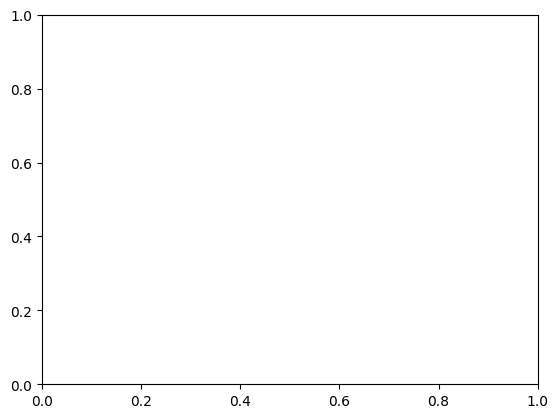

In [11]:
from sklearn.svm import SVC 
from sklearn.preprocessing import LabelEncoder

# Encode target labels
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(df['y_cysticity_tag'])

# One-hot encode target labels
# y_encoded = pd.get_dummies(df['y_cysticity_tag'])

# Create the MinMaxScaler object
scaler = MinMaxScaler(feature_range=(0, 1))  # You can adjust the range here

# Normalize the DataFrame (excluding non-numeric columns)
df_normalized = pd.DataFrame(scaler.fit_transform(df.select_dtypes(include=[np.number])))
df_normalized.columns = df.select_dtypes(include=[np.number]).columns  # Maintain column names


X_train, X_test, y_train, y_test = train_test_split(df_normalized, y_encoded, test_size=0.2, random_state=42)

# Train an SVM model with linear kernel
model = SVC(kernel='linear')
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"SVM - Accuracy: {accuracy:.4f}")

# Get decision function scores for class y1 (assuming binary classification)
decision_scores = model.decision_function(X_test)

# Example assuming first two features from X_test
plt.scatter(X_test.iloc[:,0], decision_scores) #, c=y_test)
plt.xlabel("Feature 1")
plt.ylabel("Decision Function Score (y1)")
plt.title("Decision Scores vs Feature 1 (Class y1)")
plt.legend()
plt.show()

In [22]:
import seaborn as sns

# Assuming first two features from X_test and decoded labels for legend
decoded_labels = encoder.inverse_transform(y_test)

sns.pairplot(X_test.iloc[:, :2], decision_scores, hue=decoded_labels)
plt.show()




TypeError: pairplot() takes 1 positional argument but 2 positional arguments (and 1 keyword-only argument) were given

In [25]:
combined_data

,area,area_bbox,Class 1 Score,Class 2 Score,Class 3 Score
140,0.040653,0.044820,NaN,NaN,NaN
113,0.033073,0.044337,NaN,NaN,NaN
16,0.208075,0.224946,-0.254703,0.831759,2.269942
75,0.010351,0.011734,NaN,NaN,NaN
155,0.011225,0.010819,NaN,NaN,NaN
...,...,...,...,...,...
35,NaN,NaN,0.889977,-0.228847,2.242825
36,NaN,NaN,1.040181,-0.225723,2.220741
37,NaN,NaN,2.179285,-0.212083,1.123068
38,NaN,NaN,1.005530,-0.236992,2.236520


In [29]:
decoded_labels

array(['NonCytstic', 'NonCytstic', 'Cytstic', 'NonCytstic', 'NonCytstic',
       'NonCytstic', 'NonCytstic', 'NonCytstic', 'Cytstic', 'NonCytstic',
       'Cytstic', 'Cytstic', 'Cytstic', 'NonCytstic', 'NonCytstic',
       'NonCytstic', 'NonCytstic', 'Cytstic', 'NonCytstic', 'Cytstic',
       'NonCytstic', 'NonCytstic', 'NonCytstic', 'NonCytstic',
       'NonCytstic', 'NonCytstic', 'NonCytstic', 'Cytstic',
       'HeavilyCystic', 'NonCytstic', 'NonCytstic', 'NonCytstic',
       'NonCytstic', 'NonCytstic', 'NonCytstic', 'NonCytstic',
       'NonCytstic', 'Cytstic', 'NonCytstic', 'NonCytstic'], dtype=object)

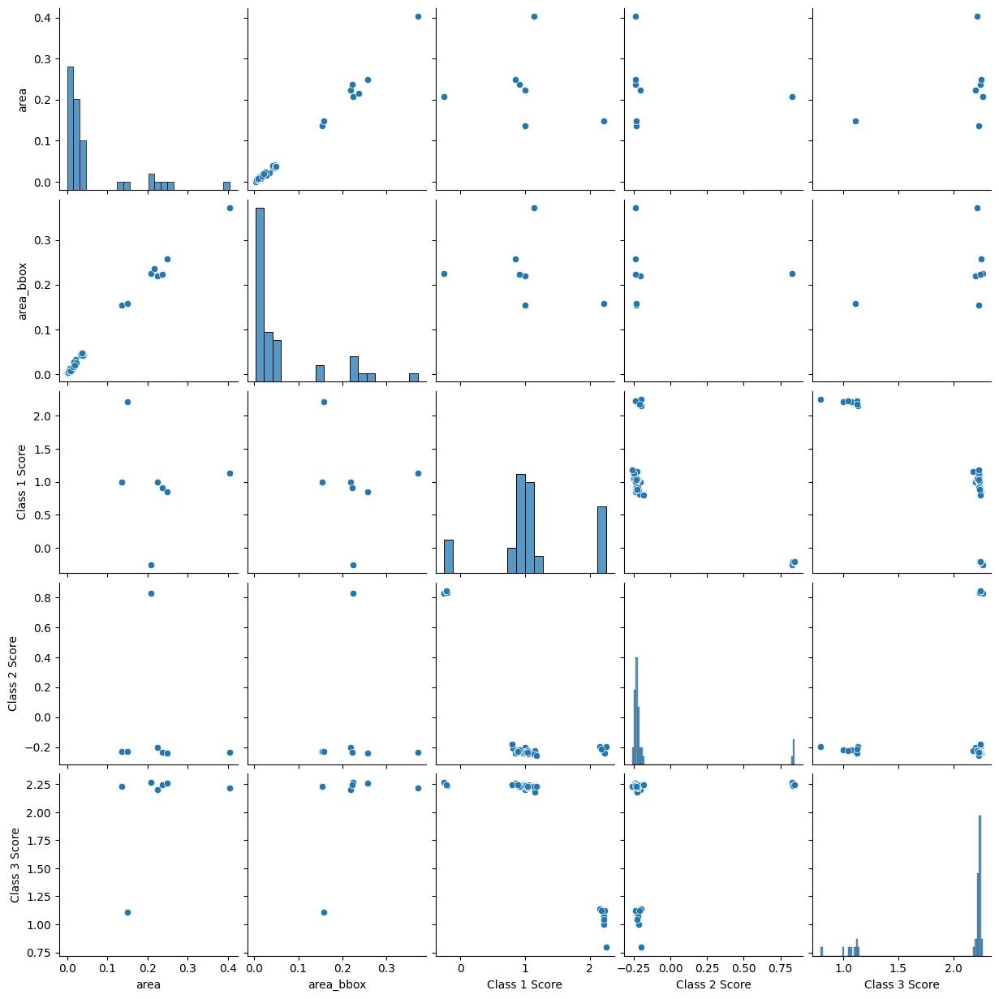

In [33]:
# # Assuming first two features from X_test and decoded labels for legend
decoded_labels = encoder.inverse_transform(y_test)

# # Combine features and decision scores into a single DataFrame
combined_data = pd.concat([X_test.iloc[:, :2], pd.DataFrame(decision_scores, columns=['Class 1 Score', 'Class 2 Score', 'Class 3 Score'] )], axis=1)

# Ensure decoded_labels is treated as categorical (assuming string labels)
# sns.pairplot(pd.DataFrame(decision_scores, columns=['Class 1 Score', 'Class 2 Score', 'Class 3 Score']))#, hue=decoded_labels)  # Convert to string type explicitly
# plt.show()

sns.pairplot(combined_data)#, hue=decoded_labels)
plt.show()



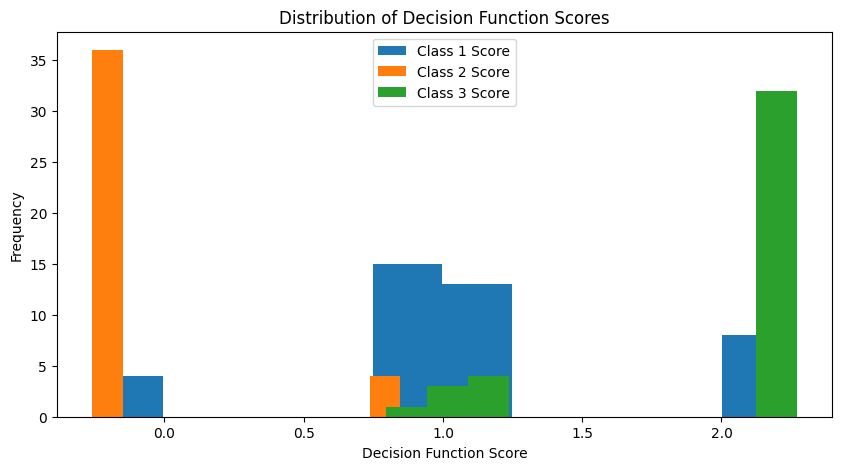

In [21]:
plt.figure(figsize=(10, 5))

# Plot histograms for each class decision score
plt.hist(decision_scores[:, 0], label='Class 1 Score')
plt.hist(decision_scores[:, 1], label='Class 2 Score')
plt.hist(decision_scores[:, 2], label='Class 3 Score')
plt.legend()
plt.xlabel("Decision Function Score")
plt.ylabel("Frequency")
plt.title("Distribution of Decision Function Scores")
plt.show()

### analysis with two class function

In [4]:
# working on a copy and ceatig two classes
cyst_df = df.copy()
cyst_df['y_cysticity_tag'] = np.where(df['y_cysticity_tag'] == 'HeavilyCystic', 'Cytstic',  df['y_cysticity_tag'])

cyst_df.dropna(axis = 1, inplace = True)
print('df -------> ', df['y_cysticity_tag'].unique())
print('cyst_df--->',cyst_df['y_cysticity_tag'].unique())
print(cyst_df.shape)

##Selecting numerical features and append the features of numerical_data to list
numerical_data = cyst_df.select_dtypes(include = [np.number])
numerical_features = numerical_data.columns.tolist()
print(numerical_features)
print(f'There are {len(numerical_features)} numerical features:', '\n')


#Selecting categoricalfeatures and append the features of categorical_data to list
categorical_data = cyst_df.select_dtypes(include = 'object')
categorical_features = categorical_data.columns.tolist()
print(categorical_features)
print(f'There are {len(categorical_features)} categorical features:', '\n')
# drop ['coords_scaled', 'image', 'image_convex', 'image_filled', 'image_intensity', 'slice'] from the catehorical dataset
cyst_df.drop(columns = ['coords_scaled', 'image', 'image_convex', 'image_filled', 'image_intensity', 'slice'], inplace = True)


df ------->  ['NonCytstic' 'Cytstic' 'HeavilyCystic']
cyst_df---> ['NonCytstic' 'Cytstic']
(197, 268)
['area', 'area_bbox', 'area_convex', 'area_filled', 'axis_major_length', 'axis_minor_length', 'bbox-0', 'bbox-1', 'bbox-2', 'bbox-3', 'centroid-0', 'centroid-1', 'centroid_local-0', 'centroid_local-1', 'centroid_weighted-0-0', 'centroid_weighted-0-1', 'centroid_weighted-0-2', 'centroid_weighted-1-0', 'centroid_weighted-1-1', 'centroid_weighted-1-2', 'centroid_weighted_local-0-0', 'centroid_weighted_local-0-1', 'centroid_weighted_local-0-2', 'centroid_weighted_local-1-0', 'centroid_weighted_local-1-1', 'centroid_weighted_local-1-2', 'eccentricity', 'equivalent_diameter_area', 'euler_number', 'extent', 'feret_diameter_max', 'inertia_tensor-0-0', 'inertia_tensor-0-1', 'inertia_tensor-1-0', 'inertia_tensor-1-1', 'inertia_tensor_eigvals-0', 'inertia_tensor_eigvals-1', 'intensity_max-0', 'intensity_max-1', 'intensity_max-2', 'intensity_mean-0', 'intensity_mean-1', 'intensity_mean-2', 'intens

In [35]:
print(cyst_df.shape)

##Selecting numerical features
numerical_data = cyst_df.select_dtypes(include='number')
#append the features of numerical_data to list
numerical_features = numerical_data.columns.tolist()
print(numerical_features)
print(f'There are {len(numerical_features)} numerical features:', '\n')


#Selecting categoricalfeatures
categorical_data = cyst_df.select_dtypes(include= 'object')
#append the features of categorical_data to list
categorical_features = categorical_data.columns.tolist()
print(categorical_features)
print(f'There are {len(categorical_features)} categorical features:', '\n')
# drop ['coords_scaled', 'image', 'image_convex', 'image_filled', 'image_intensity', 'slice'] from the catehorical dataset


(197, 262)
['area', 'area_bbox', 'area_convex', 'area_filled', 'axis_major_length', 'axis_minor_length', 'bbox-0', 'bbox-1', 'bbox-2', 'bbox-3', 'centroid-0', 'centroid-1', 'centroid_local-0', 'centroid_local-1', 'centroid_weighted-0-0', 'centroid_weighted-0-1', 'centroid_weighted-0-2', 'centroid_weighted-1-0', 'centroid_weighted-1-1', 'centroid_weighted-1-2', 'centroid_weighted_local-0-0', 'centroid_weighted_local-0-1', 'centroid_weighted_local-0-2', 'centroid_weighted_local-1-0', 'centroid_weighted_local-1-1', 'centroid_weighted_local-1-2', 'eccentricity', 'equivalent_diameter_area', 'euler_number', 'extent', 'feret_diameter_max', 'inertia_tensor-0-0', 'inertia_tensor-0-1', 'inertia_tensor-1-0', 'inertia_tensor-1-1', 'inertia_tensor_eigvals-0', 'inertia_tensor_eigvals-1', 'intensity_max-0', 'intensity_max-1', 'intensity_max-2', 'intensity_mean-0', 'intensity_mean-1', 'intensity_mean-2', 'intensity_min-0', 'intensity_min-1', 'intensity_min-2', 'label', 'moments-0-0', 'moments-0-1', 'm

#### EDA 
- blanced targets or not 
- data distribution 
- feature corr to targets (pairplots)


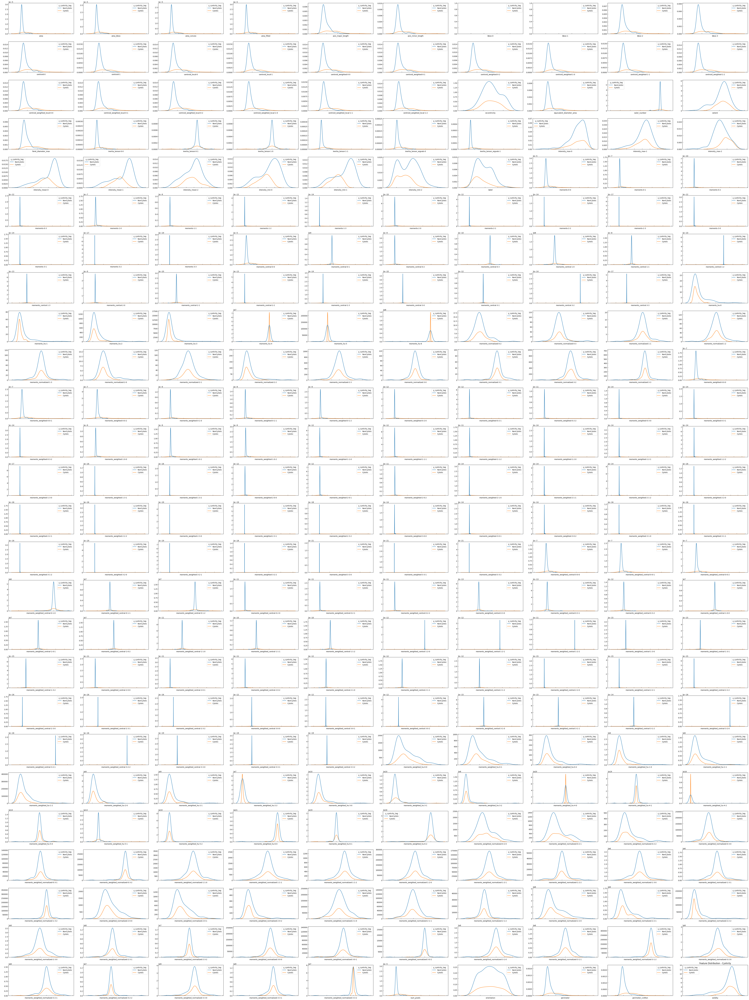

In [33]:
# data distribution of 225 features

fig,axes = plt.subplots(26, 10, figsize=(60,80), sharey = False)

for i, ax in zip(range(260), axes.flat):
  #print(i)
  
  g = sns.kdeplot(data = cyst_df, x=cyst_df.columns[i], 
                  hue = 'y_cysticity_tag', legend = True, ax=ax)
  g.tick_params(direction = 'in')
  g.set(xticklabels=[])
  g.set(ylabel=None)
  warnings.filterwarnings("ignore")
# plt.legend(labels=['Cystic', 'Non-Cystic'])
plt.title("Feature Distribution - Cysticity")
fig.tight_layout()
plt.savefig('/user/s.chakrabarty/myoTwinWork/results/profileEDA/cyst_kde_plots.png', dpi = 300)  # Adjust filename and dpi as needed


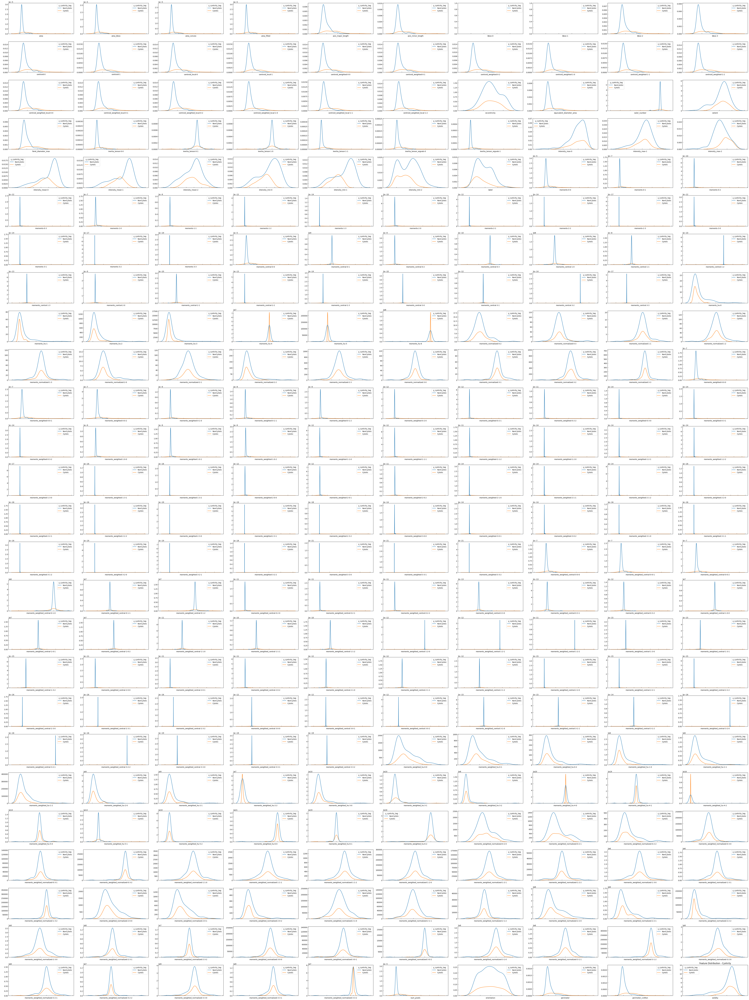

In [41]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
transformed_df = scaler.fit_transform(numerical_data)
transformed_df = pd.DataFrame(numerical_data, columns = numerical_features)
transformed_df['y_cysticity_tag'] = cyst_df['y_cysticity_tag']
transformed_df


fig,axes = plt.subplots(26, 10, figsize=(60,80), sharey = False)

for i, ax in zip(range(260), axes.flat):
  #print(i)
  
  g = sns.kdeplot(data = transformed_df, x=transformed_df.columns[i], 
                  hue = 'y_cysticity_tag', legend = True, ax=ax)
  g.tick_params(direction = 'in')
  g.set(xticklabels=[])
  g.set(ylabel=None)
  warnings.filterwarnings("ignore")
# plt.legend(labels=['Cystic', 'Non-Cystic'])
plt.title("Feature Distribution - Cysticity")
fig.tight_layout()
plt.savefig('/user/s.chakrabarty/myoTwinWork/results/profileEDA/cyst_transformed_kde_plots.png', dpi = 300) 


In [18]:
# data distribution of 225 features

# fig,axes = plt.subplots(26, 10, figsize=(40,60), sharey = False)

# for i, ax in zip(range(260), axes.flat):
#   #print(i)
#   print(cyst_df.columns[i])
#   g = sns.histplot(data = cyst_df, x=cyst_df.columns[i], 
#                   hue = 'y_cysticity_tag', legend = False, ax=ax)
#   g.tick_params(direction = 'in')
#   g.set(xticklabels=[])
#   g.set(ylabel=None)
#   warnings.filterwarnings("ignore")
#   # break
# fig.tight_layout()
# plt.savefig('/user/s.chakrabarty/myoTwinWork/results/profileEDA/cyst_hist_plots.png', dpi = 300)  # Adjust filename and dpi as needed

area
area_bbox
area_convex
area_filled
axis_major_length
axis_minor_length
bbox-0
bbox-1
bbox-2
bbox-3
centroid-0
centroid-1
centroid_local-0
centroid_local-1
centroid_weighted-0-0
centroid_weighted-0-1
centroid_weighted-0-2
centroid_weighted-1-0
centroid_weighted-1-1
centroid_weighted-1-2
centroid_weighted_local-0-0
centroid_weighted_local-0-1
centroid_weighted_local-0-2
centroid_weighted_local-1-0
centroid_weighted_local-1-1
centroid_weighted_local-1-2
eccentricity
equivalent_diameter_area
euler_number
extent
feret_diameter_max
inertia_tensor-0-0
inertia_tensor-0-1
inertia_tensor-1-0
inertia_tensor-1-1
inertia_tensor_eigvals-0
inertia_tensor_eigvals-1
intensity_max-0
intensity_max-1
intensity_max-2
intensity_mean-0
intensity_mean-1
intensity_mean-2
intensity_min-0
intensity_min-1
intensity_min-2
label
moments-0-0
moments-0-1
moments-0-2
moments-0-3
moments-1-0
moments-1-1
moments-1-2
moments-1-3
moments-2-0
moments-2-1
moments-2-2
moments-2-3
moments-3-0
moments-3-1
moments-3-2
momen

KeyboardInterrupt: 

In [9]:
# for pairplot use featues that have more than 2 unique value
numerical_data.value_counts()
numerical_data.columns[numerical_data.nunique() < 100]

Index(['bbox-0', 'bbox-1', 'euler_number', 'intensity_max-0',
       'intensity_max-1', 'intensity_max-2', 'intensity_min-0',
       'intensity_min-1', 'intensity_min-2', 'label'],
      dtype='object')

In [59]:
sns.pairplot(cyst_df, hue = 'y_cysticity_tag')
plt.show()

KeyboardInterrupt: 

In [12]:
# num_cols = len(data.select_dtypes(include=[int, float]))  # Count numeric columns

# Create a figure with appropriate subplots based on the number of columns
rows, cols = (len(numerical_data) // 4 + 1, min(4, numerical_features))  # Adjust layout as needed
fig, axes = plt.subplots(rows, cols, figsize=(12, 8))  # Adjust figure size as needed

# Loop through each column and create a histogram on a subplot
col_index = 0
for i in range(rows):
    for j in range(cols):
        if col_index < numerical_features:
            col_name = numerical_data.columns[col_index]
            numerical_data[col_name].hist(ax=axes[i, j])  # Plot histogram on current subplot
            axes[i, j].set_title(col_name)  # Set subplot title
            col_index += 1
        else:
            axes[i, j].axis('off')  # Hide unused subplots

# Adjust layout and display the plot
fig.tight_layout()
plt.show()

TypeError: '<' not supported between instances of 'list' and 'int'

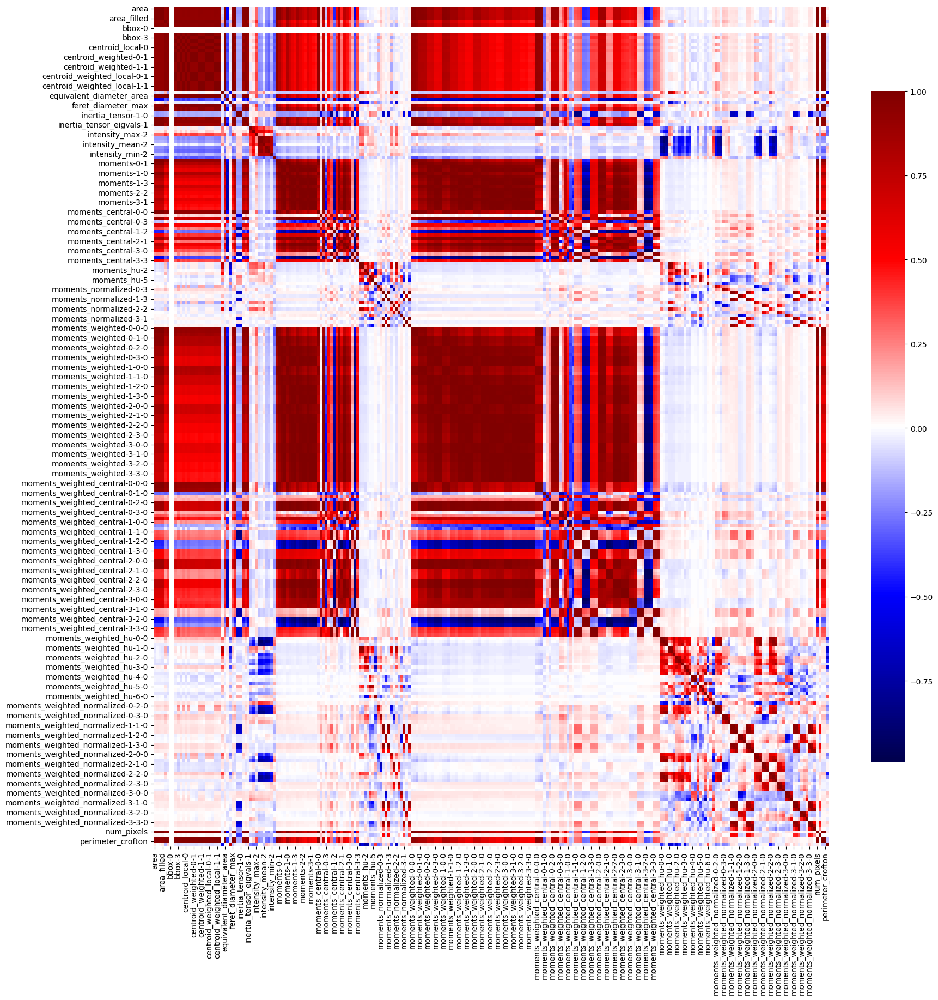

In [42]:
df_corr_p = numerical_data.corr(method='pearson')
plt.figure(figsize=(20,20))
sns.heatmap(df_corr_p, cmap="seismic", cbar_kws={"shrink": .8});
plt.savefig('/user/s.chakrabarty/myoTwinWork/results/profileEDA/cyst_PearsonCorr.png', dpi = 300) 

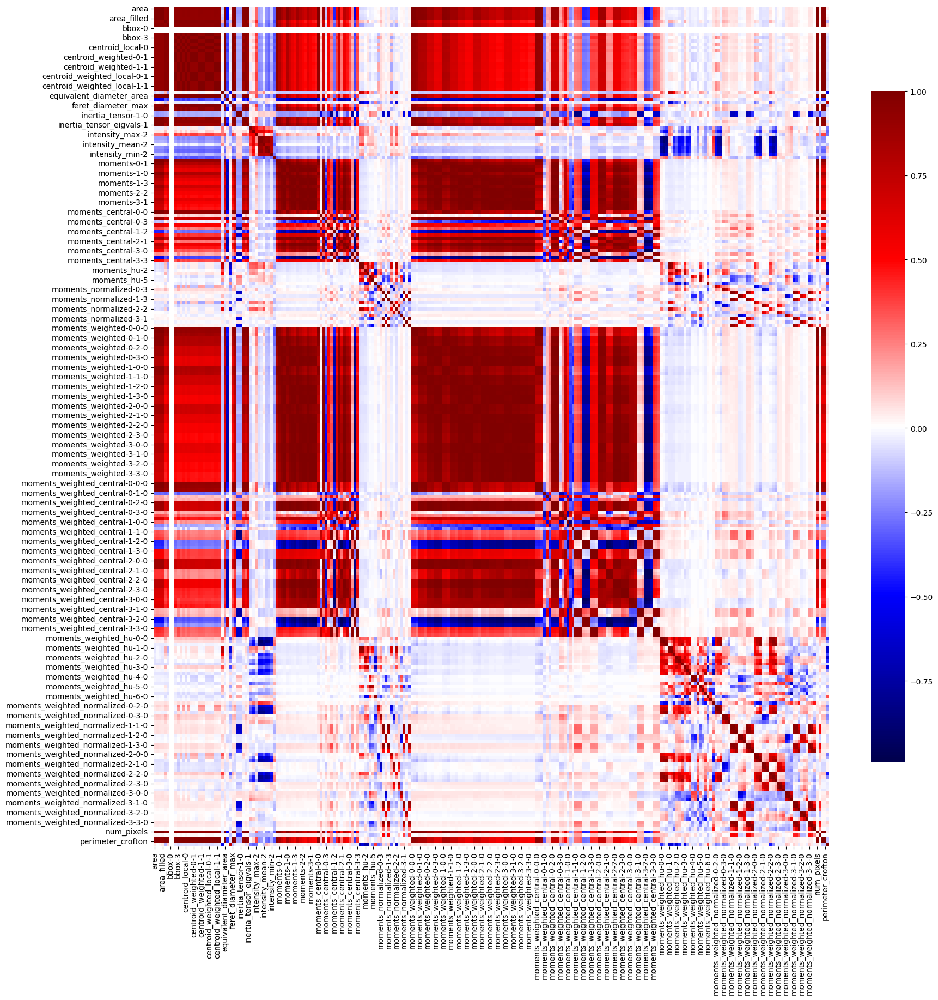

In [49]:
df_corr_p = transformed_df.drop(['y_cysticity_tag'], axis = 1).corr(method='pearson')
# df_corr_p = transformed_df.corr(method='pearson')
plt.figure(figsize=(20,20))
sns.heatmap(df_corr_p, cmap="seismic", cbar_kws={"shrink": .8});
plt.savefig('/user/s.chakrabarty/myoTwinWork/results/profileEDA/transformed_cyst_PearsonCorr.png', dpi = 300) 

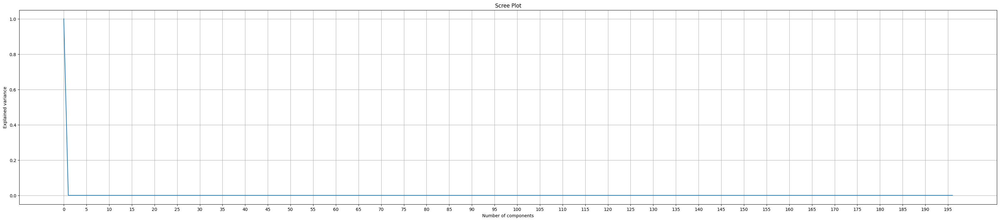

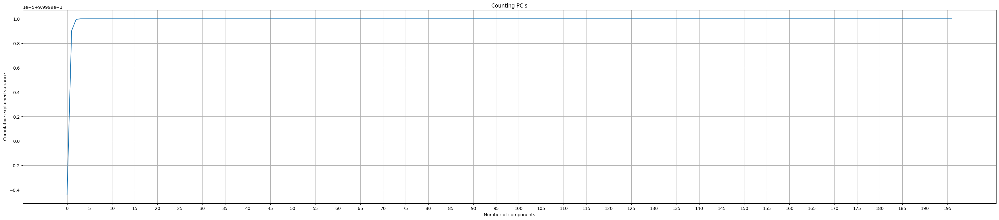

In [53]:
# Principal component analysis (PCA) is a popular dimension reduction method to reduce the complexity 
# Principal component analysis (PCA) is a popular dimension reduction method to reduce the complexity and 
# obtain the informative aspects of high-dimensional datasets. 
# When the data distribution is skewed, data transformation is commonly
# used prior to applying PCAand obtain the informative aspects of high-dimensional datasets. 
# When the data distribution is skewed, data transformation is commonly used prior to applying PCA

from sklearn.decomposition import PCA
pca = PCA()
pca_train = pca.fit_transform(transformed_df.drop(['y_cysticity_tag'], axis =1))

# Converting PC Datasets for model training
pca_df = pd.DataFrame(pca_train)

list_name = [f'pc{i}' for i in range(pca_train.shape[1])]

pca_df.columns = list_name

# NO of PC's
explained_variance = pca.explained_variance_ratio_

plt.figure(figsize=(40,8))
plt.plot(explained_variance)
plt.grid()
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.title("Scree Plot");
plt.xticks(np.arange(0, len(explained_variance), 5))
plt.show()

plt.figure(figsize=(40,8))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.grid()
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
plt.title("Counting PC's")
# Set x ticks after every 10 points
plt.xticks(np.arange(0, len(explained_variance), 5))
plt.savefig('/user/s.chakrabarty/myoTwinWork/results/profileEDA/pcaPlot.png', dpi = 300) 
plt.show()

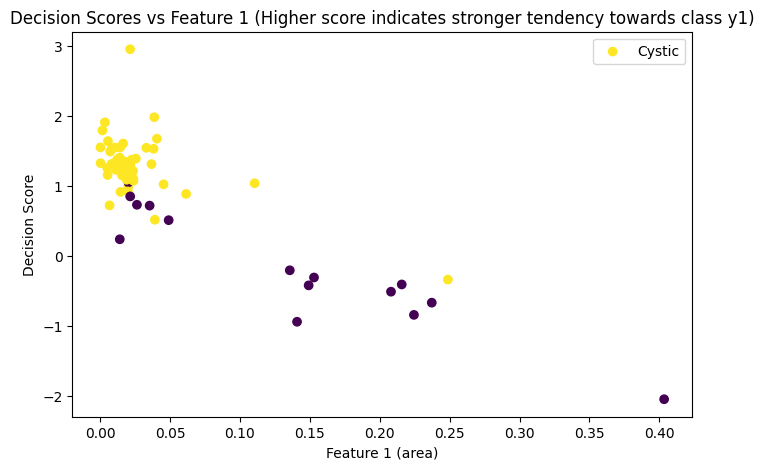

In [55]:
X = df.select_dtypes(include=[np.number])
y = np.where(df['y_cysticity_tag'] == 'HeavilyCystic', 'Cytstic',  df['y_cysticity_tag'])
# y = np.where(y == 'Cystic', 1, 0)

# Feature scaling (example with MinMaxScaler)
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))
X_scaled = scaler.fit_transform(X)

# Label encoding the target variable (replace with one-hot encoding if preferred)
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)

# Train-Test Split (70% training, 30% testing)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.3, random_state=42)


# Train an SVM Model with Linear Kernel (assuming linear kernel is suitable)
model = SVC(kernel='linear')
model.fit(X_train, y_train)

# Get Decision Function Scores for class labels (assuming binary classification)
decision_scores = model.decision_function(X_test)

# Plotting Decision Scores vs Feature (assuming you want to visualize scores vs first feature)
plt.figure(figsize=(8, 5))
plt.scatter(X_test[:, 0], decision_scores, c=y_test)  # Color points by class labels
plt.xlabel("Feature 1 (area)")
plt.ylabel("Decision Score")
plt.title("Decision Scores vs Feature 1 (Higher score indicates stronger tendency towards class y1)")
# plt.legend()  # Add legend for class labels
plt.legend(labels=['Cystic', 'Non-Cystic'])  # Adjust labels as needed

plt.show()

